<a href="https://colab.research.google.com/github/AbdallhMetwallycs/pix2pix/blob/main/understanding_piix2piix_in_details.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

** building a pix2pix model with u-net architecture **


importing libraries 


In [1]:
import tensorflow as tf
import os 
import time 
import datetime
import matplotlib.pyplot as plt
from IPython import display
import pathlib
from google.colab import drive

importing dataset from drive 


# New Section
load dataset to the model

load from drive

In [2]:
dataset_name = "facecad"

In [3]:
drive.mount('/content/drive/')  #/content/drive/MyDrive/facades

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


# load from websites "on PC"
no need to run this cell in google colab 

In [4]:
# # download and extracting data set if it zipped
# # download from 
# _url = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'

# path_to_zip = tf.keras.utils.get_file(
#     fname = f"{dataset_name}.tar.gz",
#     origin = _url,
#     extract = True
# )
# path_to_zip = pathlib.Path(path_to_zip)

# PATH = path_to_zip.parent/dataset_name

In [5]:
sample_image = tf.io.read_file('/content/drive/MyDrive/facades/train/1.jpg')    # /content/drive/MyDrive/facades/train/100.jpg
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)
# (height , width, channels)

(256, 512, 3)


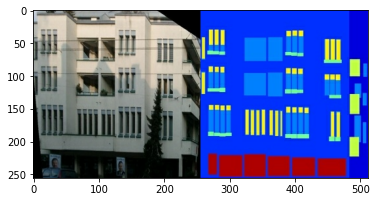

In [6]:
plt.figure()
plt.imshow(sample_image)

seperate real images from the label images **sketched images**
each to be 256*256

function to load images and outputs 2 image tensors float32

In [7]:
def load_image(image_file):
    image = tf.io.read_file(image_file)
    image = tf.io.decode_jpeg(image)

    # splitting 
    w = tf.shape(image)[1]
    w = w // 2
    # w now have two 256*256 one for real image and one for labeled/input image 
    # assigning the images 
    input_image = image[:, w:, :]  # [height: ,:widthh_real , channels: ]
    real_image = image[:, :w, :]  # [height: ,width_input: , channels: ]

    # convert images to float32 tensor
    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    return input_image, real_image


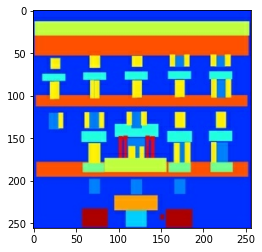

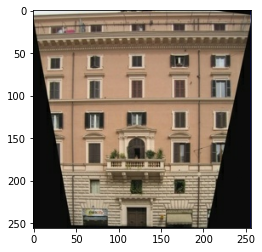

In [8]:
# cheacking 
input, real = load_image('/content/drive/MyDrive/facades/train/90.jpg')  # /content/drive/MyDrive/facades/train/100.jpg
#casting to int for matplotlib to display images 
plt.figure()
plt.imshow(input / 255.0)
plt.figure()
plt.imshow(real / 255.0)

apply random jittering and mirroring to preprocess the training set.

Define several functions that:

Resize each 256 x 256 image to a larger height and width—286 x 286.
Randomly crop it back to 256 x 256.
Randomly flip the image horizontally i.e. left to right (random mirroring).
Normalize the images to the [-1, 1] range.

In [9]:
# The  training set consist of number_of_images images = buffer_size
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

# PREPROCESSING THE IMAGES FUNCTIONS



In [10]:
# resizing all images to same width and height 
def resize(input_image, real_image, width, height):
    input_image = tf.image.resize(input_image,[height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image,[height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

In [11]:
# randomly crop images to 256*256
def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)   #tf.stack() used to stack input and output together 
    # (number of stcked images, height, width, channels)
    # shape(2 ,256,256,3)
    cropped_image = tf.image.random_crop(
        stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3]
    )
    return cropped_image[0], cropped_image[1]

In [12]:
# Normalizing values of the images matrix to [-1 , 1] highest value in the image matrix for X subscript (i) is '255' and the lowest is '0'
def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1  # try any number in [0 : 255] the output will be in [-1 : 1]
    real_image = (real_image / 127.5) - 1   # try any number in [0 : 255] the output will be in [-1 : 1]

    return input_image, real_image

In [13]:
@tf.function()
def random_jittering(input_image, real_image):
    # Resizing to 286x286
    input_image, real_image = resize(input_image, real_image, 286, 286)

    # Random cropping back to 256x256
    input_image, real_image = random_crop(input_image, real_image)

    if tf.random.uniform(()) > 0.5:
        # Random mirroring
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image



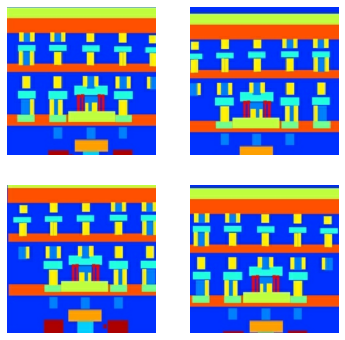

In [14]:
plt.figure(figsize=(6, 6))
for i in range(4):
    rj_inp, rj_re = random_jittering(input, real)
    plt.subplot(2, 2, i + 1)
    plt.imshow(rj_inp / 255.0)
    plt.axis('off')
plt.show()

 # ALL IN ONE FOR TRAIN AND TEST 
 2 FUNCTIONS TO PREPROCESSING THE TRAIN DATA AND TEST DATA  


In [15]:
# load image for training 
# applying random jittetr and normalize

def load_images_train(image_file):
    input_image, real_image = load_image(image_file)  # splitting the image to real and input 
    input_image, real_image = random_jittering(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image 

def load_image_train(image_file):
  input_image, real_image = load_image(image_file)
  input_image, real_image = random_jittering(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [16]:
# load image for testing
# applying resizing to 256*256 and normalize

def load_images_test(image_file):
    input_image, real_image = load_image(image_file)  # splitting the image to real and input 
    input_image, real_image = resize(input_image, real_image, IMG_WIDTH, IMG_HEIGHT)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image 

# INPUT PIPLINE WITH TF.DATA 

In [17]:
# for training
train_dataset = tf.data.Dataset.list_files(str('/content/drive/MyDrive/facades/train/*.jpg'))

train_dataset = train_dataset.map(load_images_train, num_parallel_calls=tf.data.AUTOTUNE)  
# is used to apply the load_image_train function to each element of the train_dataset in parallel using multiple CPU cores. like for loop 
# The map() function applies this function to each element of the dataset and returns a new dataset with the same number of elements, but where each element is a tuple of two tensors.
# By setting num_parallel_calls=tf.data.AUTOTUNE,
#  TensorFlow automatically determines the optimal number of CPU cores to use for parallel processing based on available system resources. 
#  This can significantly speed up data loading and preprocessing.

train_dataset = train_dataset.shuffle(BUFFER_SIZE)

# number of input size

train_dataset = train_dataset.batch(BATCH_SIZE)

In [18]:
# for testing
try:
    test_dataset = tf.data.Dataset.list_files(str('/content/drive/MyDrive/facades/test/*.jpg'))
except:
    test_dataset2 = tf.data.Dataset.list_files(str('/content/drive/MyDrive/facades/val/*.jpg'))

test_dataset = test_dataset.map(load_images_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

# THE GENERATOR

---
**1-Each block in the encoder is: Convolution -> Batch normalization -> Leaky ReLU

2-Each block in the decoder is: Transposed convolution -> Batch normalization -> Dropout (applied to the first 3 blocks) -> ReLU

3-There are skip connections between the encoder and decoder **

the downsampler (encoder)

In [19]:
OUT_PUT_CHANNELS = 3

In [20]:
def downsampler(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0. ,0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))  # strides number of moves in pixel matrix

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    
    result.add(tf.keras.layers.LeakyReLU())

    return result

In [21]:
down_model = downsampler(3, 2)
down_result = down_model(tf.expand_dims(input, 0))
print(down_result.shape)
# (1, 128, 128 ,3)
# batch_size = 1 
# (1, 128, 128 ,3)
# batch_size = 1 
# channels = 3
# width = height = 128

(1, 128, 128, 3)


define the upsampler (decoder)

In [22]:
def upsampler(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    
    result.add(tf.keras.layers.BatchNormalization())
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    
    result.add(tf.keras.layers.ReLU())

    return result
    


In [23]:
up_model = upsampler(3,2)
up_result = up_model(down_result)
print(up_result.shape)

# (1, 256, 256 ,3)
# batch_size = 1 
# channels = 3
# width = height = 256

(1, 256, 256, 3)


In [24]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    down_stack = [
        downsampler(64, 4, apply_batchnorm=False),  # (batch_size, 128,128,64)
        downsampler(128, 4),  # (batch_size, 64, 64, 128)
        downsampler(256, 4),  # (batch_size, 32, 32, 256)
        downsampler(512, 4),  # (batch_size, 16, 16, 512)
        downsampler(512, 4),  # (batch_size, 8, 8, 512)
        downsampler(512, 4),  # (batch_size, 4, 4, 512)
        downsampler(512, 4),  # (batch_size, 2, 2, 512)
        downsampler(512, 4)  # (batch_size, 1, 1, 512)
    ]

    up_stack = [
        upsampler(512, 4, apply_dropout=True),  # ( batch_size, 2, 2, 1024)
        upsampler(512, 4, apply_dropout=True),  # ( batch_size, 4, 4, 1024)
        upsampler(512, 4, apply_dropout=True),  # ( batch_size, 8, 8, 1024)
        upsampler(512, 4),  # ( batch_size, 16, 16, 1024)
        upsampler(256, 4),  # ( batch_size, 32, 32, 512)
        upsampler(128, 4),  # ( batch_size, 64, 64, 256)
        upsampler(64, 4)    # ( batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0. ,0.02)
    last = tf.keras.layers.Conv2DTranspose(OUT_PUT_CHANNELS, 4, strides=2, padding="same", kernel_initializer=initializer, activation='tanh')
      # tanh is better than sigmoid in hidden layers 
      # (batch_size, 256, 256, 3)

    x = inputs
    # down sampling through the model 
    skips = []

    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # upsampling and establishing the skip connections

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

**Visualizing the Generator Architecture**

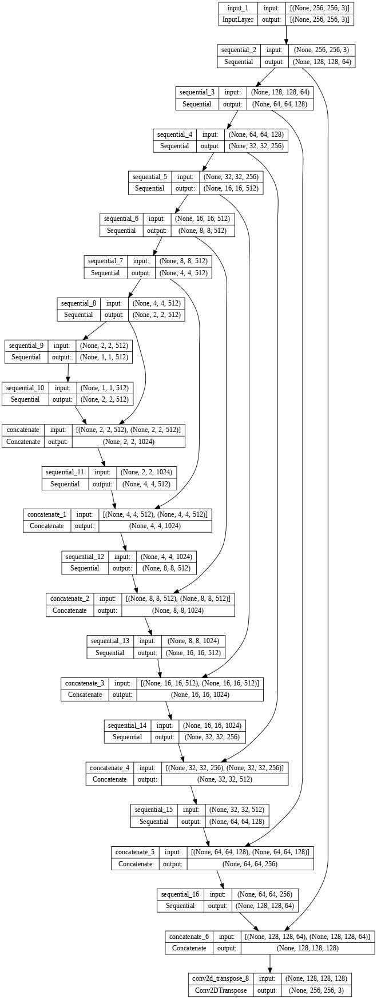

In [25]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

# testing the generator 

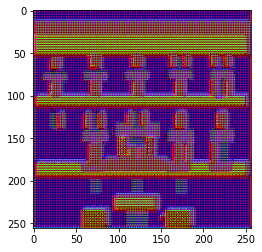

In [26]:
gen_output = generator(input[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

# the Generator loss
gan loss + LAMBDA *L1_loss


In [27]:
LAMBDA = 100

In [28]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)  

In [29]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # mean absolute error
    L1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (LAMBDA*L1_loss)

    return total_gen_loss, gan_loss, L1_loss 

# Build the Discriminator 
**PatchGan classifier**  
each block is Conv >> Batch Normalization >> Leaky relu = max(0.01 *z,z)
the shape of the output after the last layer is (batch_size=1, 30, 30, 1)
each (30 * 30) image patch of the output classifies (70 * 70) portion of the input layer 

discriminator outputs 

1.   input_image , target_image , """which it should classify it real""" 

2.   input_image , generated_image(**output of the Generator**) , 
        """which it should classify it as fake  """
        
3.   Use tf.concat([input_image,target_image], axis=1) to concatenate together



In [30]:

def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    input_image = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    target_image = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')
                                                                                                                 # (batch_size, height, width, filters/channels)
    x = tf.keras.layers.concatenate([input_image, target_image])                                                 # (batch_size, 256, 256, channels*2)  "channels=6"
    down1 = downsampler(64, 4, apply_batchnorm=False)(x)                                                         # (batch_size, 128, 128, 64)
    down2 = downsampler(128, 4)(down1)                                                                           # (batch_size, 64, 64, 128)
    down3 = downsampler(256, 4)(down2)                                                                           # (batch_size, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)                                                           # (batch_size, 32, 32, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)  # (batch_size, 34, 34, 512)
    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)                                                      # (batch_size, 31, 31, 512)
    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)                                                      # (batch_size, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)                    # (batch_size, 30, 30, 1)

    return tf.keras.Model(inputs=[input_image, target_image], outputs=last)


# visualizing the discriminator model architecture

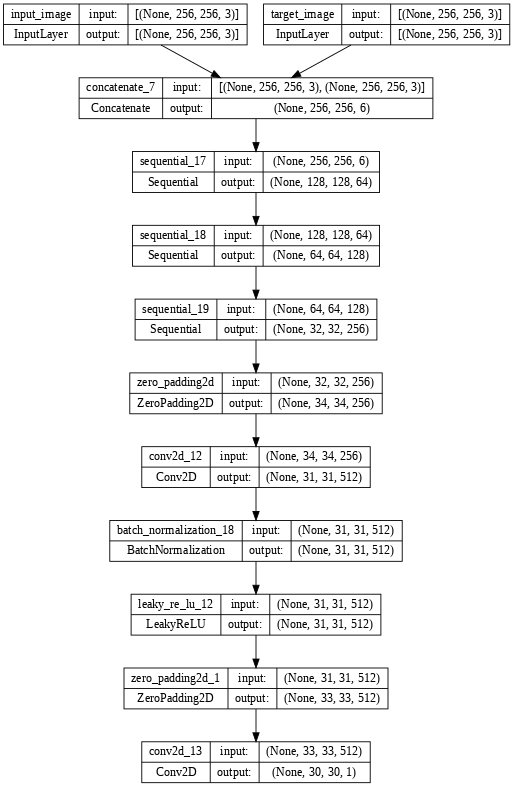

In [31]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)



# testing the discriminator

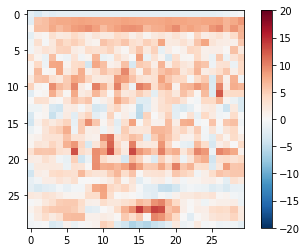

In [32]:
disc_output = discriminator([input[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_output[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

# define the discriminator loss
discriminator loss take 2 inputs (real_image, generated image)

1. real_loss is a sigmoid_entropy loss of the **real_images**  and an  
        **array  of ones(since these are the real the image)** .

2. generated_loss is a sigmoid cross_entropy loss of the **generated images**
    and an **array of zeros(since these are the fake the image)**0

3. total loss is the sum of **real_loss ** and ** generated_loss**.

In [33]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss
    
    return total_disc_loss
    


# define the optimizer 

In [34]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# checkpoints

In [35]:
checkpoint_dir = './training_checkppoints'

checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')

checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer, discriminator_optimizer=discriminator_optimizer, generator=generator, discriminator=discriminator)

# generating images 
 
 1. 

In [36]:
def generated_images(model, test_input, target):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(30, 30))

    dsiplay_list = [test_input[0], target[0], prediction[0]]
    title = ['input image', 'ground truth', 'predicted image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])

        plt.imshow(dsiplay_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()
    

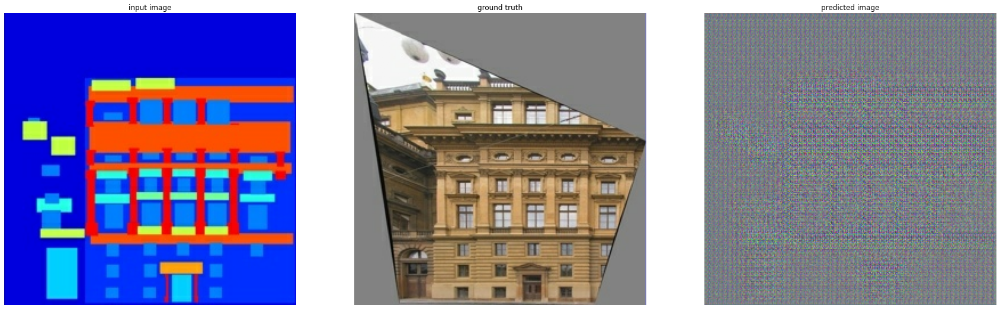

In [37]:
# testing the function 

for example_input, example_target in test_dataset.take(1):
    generated_images(generator, example_input, example_target)

# TRAINING

1. For each example input generates an output.

2. The discriminator receives the **input_image and the generated image** as 
   the **first input**, **The second input** is **the input_image and the 
   target_image**.

3. Next, calculate the** generator and the discriminator loss.**

4. Then, calculate the gradients of loss with respect to both the generator and 
   the discriminator variables(inputs) and apply those to the optimizer.

5. Finally, **log the losses** to TensorBoard.





In [38]:
log_dir = "logs/"

summary_writer = tf.summary.create_file_writer( log_dir + "fit" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))  #.strftime("%Y%m%d-%H%M%S") year, month, day-hour, min, sec

In [48]:
@tf.function

def train_step(input_image, target_image, steps=10000):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)  # gen_output = generated_image

        disc_generated_output = discriminator([input_image, gen_output], training=True)  # first input for discriminator 

        disc_real_output = discriminator([input_image, target_image], training=True) # second input for discriminator
        # calculate the generator and discriminator loss
        # generator loss
        gen_total_loss , gen_gan_loss, gen_L1_loss = generator_loss(disc_generated_output, gen_output, target_image)
        # discriminator loss
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    # gradient of loss
    generator_gradient = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradient, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradient, discriminator.trainable_variables))
  
    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=steps//1000)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=steps//1000)
        tf.summary.scalar('gen_L1_loss', gen_L1_loss, step=steps//1000)
        tf.summary.scalar('disc_loss', disc_loss, step=steps//1000)


The actual training loop. Since this tutorial can run of more than one dataset, and the datasets vary greatly in size the training loop is setup to work in steps instead of epochs.

1. Iterates over the number of steps.
2. Every 10 steps print a dot (.).
3. Every 1k steps: clear the display and run generate_images to show the progress.
4. Every 5k steps: save a checkpoint.

In [49]:
def fit(train_dataset, test_dataset, steps):
    example_input, example_target = next(iter(test_dataset.take(1)))
    start = time.time()

    for step, (input_image, target_image) in train_dataset.repeat().take(steps).enumerate():
        if (step) % 1000 == 0:
            display.clear_output(wait=True)

            if step != 0:
                print(" time taken for 1000 steps : {time.time()-start:.2f} sec\n")
            
            start = time.time()

            generated_images(generator, example_input, example_target)
            print(f"Step: {step//1000}k")
        
        train_step(input_image, target_image, step)

        # training step
        if (step+1) % 10==0:
            print('.', end=" ", flush=True)

        # save checkpoint
        if (step+1) % 5000==0:
            checkpoint.save(file_prefix=checkpoint_prefix)

# launch a viewer

In [50]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 9886), started 0:04:08 ago. (Use '!kill 9886' to kill it.)

<IPython.core.display.Javascript object>

# run the training loop

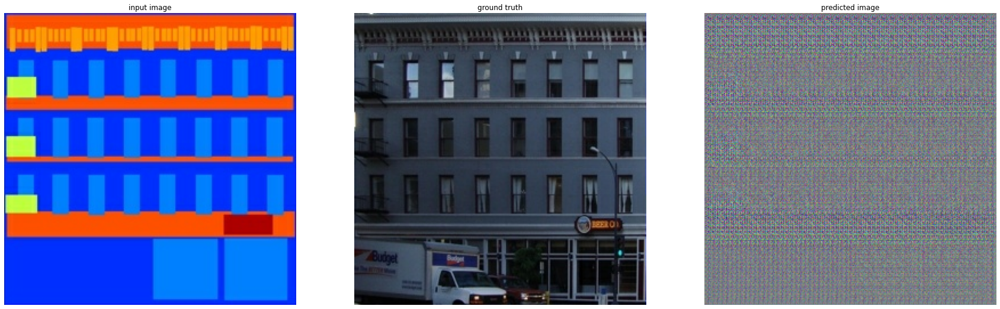

Step: 0k
. . . . . . . . . . . . 

In [ ]:
fit(train_dataset, test_dataset, steps=40000)

# share the TensorBoard results

In [ ]:
tensorboard dev upload --logdir {log_dir}

In [ ]:
display.IFrame(
    src="https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw",
    width="100%",
    height="1000px")

# Restore the latest checkpoint and test the network

In [ ]:
ls {checkpoint_dir}

In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

# Generate some images using the test set

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generated_images(generator, inp, tar)